# Assignment 2. Local Operations

<span style="color:orange">Ground Rules for the Assignment: </span>

* <span style="color:lightblue"> You can only use basic functions (matrix operations, input/output image functions, plotters). Anything else, you need to code from scratch (histogram functions, inverting gamma functions, color matting, histogram equalization)</span>
* <span style="color:lightblue"> The code needs to be appropiately commented and should be reproducible; if we cannot re-generate your figures from your code, we will deduct points.</span>
* <span style="color:lightblue">The notebook report should be detailed and include partial and final solutions for each exercise. We grade solely the report; code without report will not be graded, so we encourage that you invest some time on it</span>
* <span style="color:lightblue">Interactive plots are welcome but most important results should be static and generated beforehand</span>
* <span style="color:lightblue">__Remember to remove all plots from the "coding" sections.__ Only the Report should output plots and/or images.</span>


<span style="color:orange">Submission Details</span>

Simply submit this Jupyter Notebook with the report inlined as described below. The notebook should be executed before submission. Name the file as 
```surname1_name1_surname2_name2_assignment2.ipynb```


In [11]:
# Loading Libraries you will need for the assignment.- Install them in your environment if you haven't done so yet
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2 #opencv python
from scipy.signal import convolve2d

## 1. Linear Motion Blur Filter [7 points]

The Gaussian kernels you have seen in the lecture are radially symmetric, i.e., isotropic. One can make Gaussian filters directional, i.e., anisotropic, by defining standard deviations separately for horizontal and vertical directions. More precisely, given two standard deviations $\sigma_x$ and $\sigma_y$ for the horizontal and vertical direction, respectively, the anisotropic Gaussian is defined by:

\begin{equation}
G(x,y) = A\cdot e^{-\left(\frac{x^2}{2\sigma_x^2}+\frac{y^2}{2\sigma_y^2}\right)},
\end{equation}

where A is the normalizing coefficient that makes the weights sum up to 1. 

Additionally, we can rotate the Gaussian function by angle $\theta$ by applying rotation to the coordinates of the kernel. In practice, you define your rotated Gaussian as:
\begin{equation}
G(x,y) = A\cdot e^{-\left(\frac{x_\theta^2}{2\sigma_x^2}+\frac{y_\theta^2}{2\sigma_y^2}\right)},
\end{equation}

where

\begin{equation}
x_\theta = x \cdot cos(\theta) - y \cdot sin(\theta)
\end{equation}

\begin{equation}
y_\theta = x \cdot sin(\theta) + y \cdot cos(\theta).
\end{equation}

### _Task_

In this exercise, you will simulate a motion blur with the anisotropic Gaussian filter. The idea is to filter an image with a Gaussian filter which is oriented along the motion direction. To this end:

* Implement a function that computes an anisotropic Gaussian kernel for blurring the image along the motion direction. The function should take as an input the angle of motion ($\theta$), $\sigma_x$, and $\sigma_y$. 
* Apply this filter to the provided 'graz.png' image to simulate motion blur at an angle of 45 degrees, as shown in the Figure 1(b). Experiment with parameters $\sigma_x$ and $\sigma_y$ to obtain the results you like. Include the resulting image and the filter in the report, similarly as demonstrated in the Figure 1(b). You can use __conv2__ function for this exercise or equivalent in NumPy. 

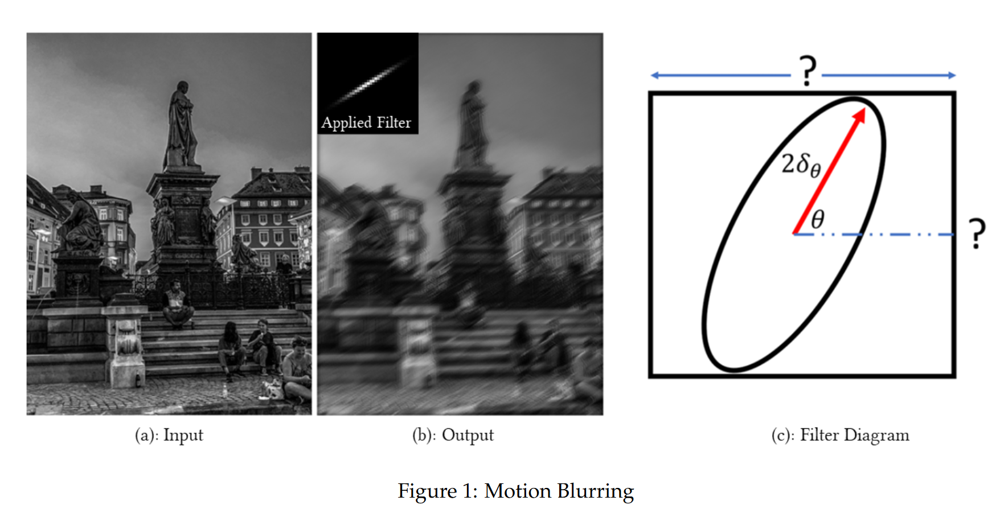

In [12]:
# Define your functions here .- you can include comments in your code explaining the steps of your algorithm
def gaussian(angle,x,y,std1,std2):
    X_prime = (x*np.cos(angle)) - (y*np.sin(angle))
    Y_prime = (x*np.sin(angle)) + (y*np.cos(angle))

    A = 1/(2*np.pi*std1*std2)
    return A * np.exp(-((X_prime**2/(2*std1**2)) + (Y_prime**2/(2*std2**2))))

def create_filter(angle,std1,std2,size):
    # NOTE: prepare a 2d grid
    ax = np.linspace(-(size // 2), size // 2, size)
    ay = np.linspace(-(size // 2), size // 2, size)
    X, Y = np.meshgrid(ax, ay)

    G = gaussian(angle,X,Y,std1,std2)
    G = G / np.sum(G)
    
    return G

def linear_motion_blur_filter(image,angle,std1,std2,size):
    kernel = create_filter(angle,std1,std2,size)
    return convolve2d(image,kernel,mode='same',),kernel



In [13]:
# Execute your code here
image = Image.open('graz.png').convert('L')  
image = np.array(image)

###  <span style="color:orange"> _Report_ </span>
<span style="color:orange"> _Report your results below. Include the resulting image and the filter in the report, similarly as demonstrated in the Figure 1(b). Please inline the resulting images with your text explaining the approach (e.g. as figures) so that the report is cohesive._ </span>

Linear Motion Blur is used to blur an image in a specific direction recreating the effect of an effective motion photo. In this case the implementation follows the formula given above where after creating a kernel of a chosen size it is possible to apply the rotated gussian filter to the image in order to retrieve the desired effect.

In the expriments then :

    - sigma_x -> controls the horizontal blur
    - sigma_y -> controls the vertical blur 

Hence by massaging the two we try to get back an image similar to the example one

Remember that we are dealing with a 45 rotated direction!! Hence sigm_x moves along that direction while sigma_y isperpendiculr to that direction

When dealing with the kernel size instead we need to take into account the fact that  a bigger kernel blurs more the image. 

#### __BLURRING ALONG THE DIRECTION OF THE MOTION WITH SIGMA_X__

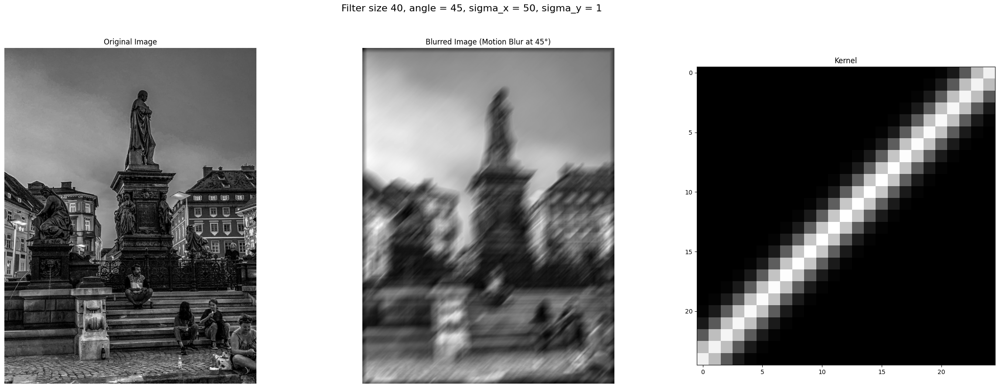

In [14]:
size = 25
std1 = 50
std2 = 1
angle = np.radians(45)

blur_img,kernel = linear_motion_blur_filter(image,angle,std1,std2,size)

plt.figure(figsize=(30, 10))
plt.suptitle(f'Filter size 40, angle = 45, sigma_x = {std1}, sigma_y = {std2}', fontsize=16)

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Blurred Image (Motion Blur at 45°)")
plt.imshow(blur_img, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title("Kernel")
plt.imshow(kernel, cmap='gray')
plt.show()

#### __BLURRING PERPENDICULARY TO THE MOTION DIRECTION__

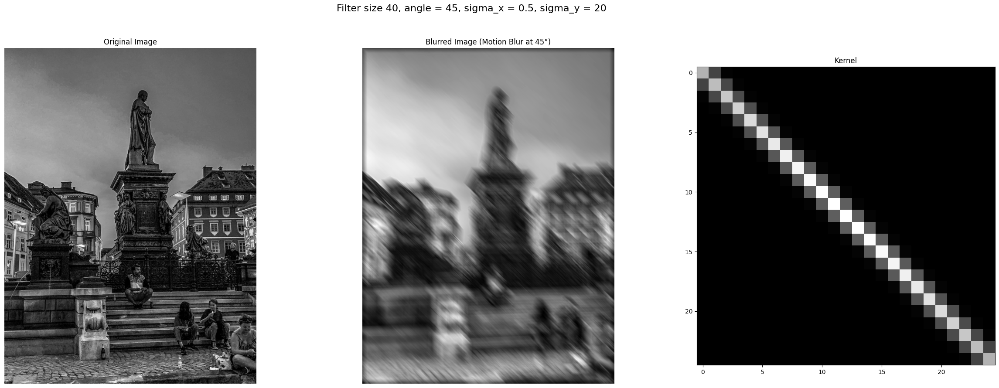

In [15]:
size = 25
std1 = 0.5
std2 = 20
angle = np.radians(45)

blur_img,kernel = linear_motion_blur_filter(image,angle,std1,std2,size)

plt.figure(figsize=(30, 10))
plt.suptitle(f'Filter size 40, angle = 45, sigma_x = {std1}, sigma_y = {std2}', fontsize=16)

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Blurred Image (Motion Blur at 45°)")
plt.imshow(blur_img, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title("Kernel")
plt.imshow(kernel, cmap='gray')
plt.show()

#### __RECREATING THE EXAMPLE OF FIGURE 1.B__

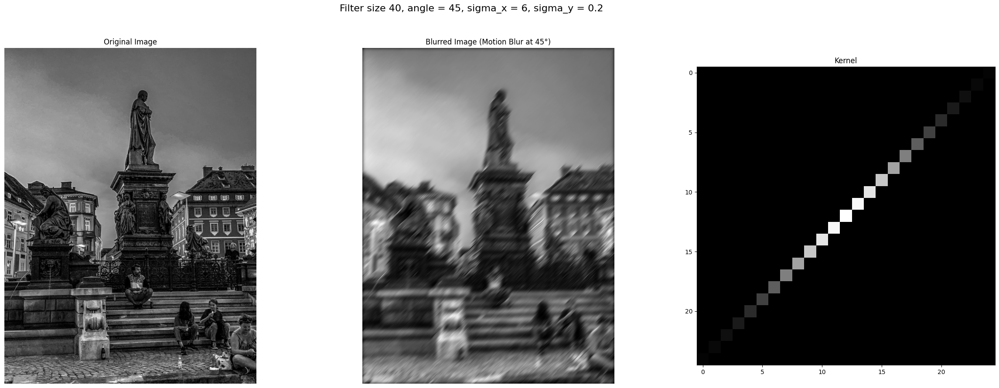

In [16]:
size = 25
std1 = 6
std2 = 0.2
angle = np.radians(45)

blur_img,kernel = linear_motion_blur_filter(image,angle,std1,std2,size)

plt.figure(figsize=(30, 10))
plt.suptitle(f'Filter size 40, angle = 45, sigma_x = {std1}, sigma_y = {std2}', fontsize=16)

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Blurred Image (Motion Blur at 45°)")
plt.imshow(blur_img, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title("Kernel")
plt.imshow(kernel, cmap='gray')
plt.show()

It is possible to see that with a kernel size not too big and not too small in order not to blur too much image, a higher sigma_x than sigma_y in order to control the strecth towards the diagonal and a low sigma_y not to move too much perpendiculary we are able to recreate a motion effect towards the right upper digonal mimicking figure 1.b   

## Iterative filtering [6 points]
Applying a Gaussian filter to an image multiple times results in a similar result to applying one bigger Gaussian filter; see Figure 2. Verify empirically to what extent this is true also for a bilateral filter. For the experiments, you can use the implementation of the bilateral filter provided in OpenCV. Note that the parameters of this function (_d_ and _SigmaSpace_) correspond to standard deviation parameters of range and domain kernels discussed during the lecture. Present the results and observations of your experiments in the report. Please provide an explanation for any differences between the results of applying a bigger bilateral filter once versus applying multiple times a smaller filter.


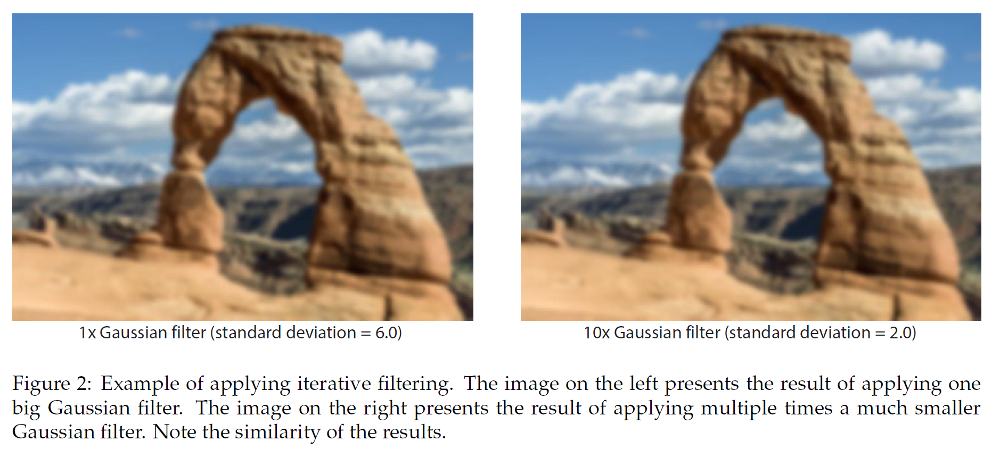

In [17]:
# Define your functions here .- you can include comments in your code explaining the steps of your algorithm

# NOTE: d is the pixel neighborhood diameter where if set to 0, the filter itself will manage
def apply_bilateral(img,sigmaColor,sigmaSpace,n):
    img_copy = img.copy()
    for i in range(n):
        img_copy = cv2.bilateralFilter(img_copy,d=0,sigmaColor=sigmaColor,sigmaSpace=sigmaSpace)
    return img_copy 

In [18]:
# Execute your code here
image_bilat = Image.open('delicate_arch.jpg').convert('RGB')
image_bilat = np.array(image_bilat).astype(np.float32) / 255.0 

###  <span style="color:orange"> _Report_ </span>
<span style="color:orange"> _Report your results below. Remember to provide an explanation for any differences between the results of applying a bigger bilateral filter once versus applying multiple times a smaller filter. Please inline the resulting images with your text explaining the approach (e.g. as figures) so that the report is cohesive._ </span>

We start from highliting the fact that gaussian filter is linear compared to bilateral filtering which is non-linear. Given this and the fact that it is also separable, applying the filter multiple times with a small σ gives back the same result as applying it once with  big σ. This method though as we can see above does not preserve edges, it smooths everything uniformly. 

The bilateral filter smooths the image while at the same time preserving the edges, this is due to the fact that :

    - gives smaller weight for distant pixels (domain kernel)
    - gives smaller weights for pixels with very different values and viceversa (range kernel)

Using the cv2.bilateralFilter function , the d argument is the diameter of the pixel neighborhood where if 0 is computed based on sigmaColor, sigmaColor controls how much color variation is effectively allowed between neighboring pixels, sigmaSpace controls instead how much distance is effectively allowed between the pixels.  So sigmaColor and SigmaSpace are used to control the two main conditions of the bilateral filter.

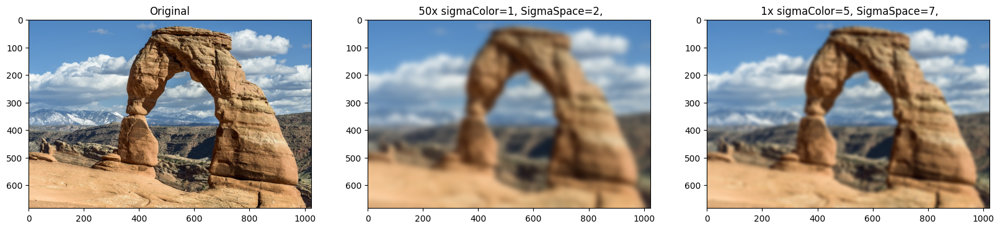

In [19]:
sigmaColor_small = 1
sigmaSpace_small = 2
sigmaColor_big = 5
sigmaSpace_big = 7
iter = 50
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.imshow(image_bilat), plt.title('Original')
plt.subplot(1,3,2), plt.imshow(apply_bilateral(image_bilat,sigmaColor_small,sigmaSpace_small,iter)), plt.title(f' {iter}x sigmaColor={sigmaColor_small}, SigmaSpace={sigmaSpace_small},')
plt.subplot(1,3,3), plt.imshow(apply_bilateral(image_bilat,sigmaColor_big,sigmaSpace_big,1)), plt.title(f' 1x sigmaColor={sigmaColor_big}, SigmaSpace={sigmaSpace_big},')
plt.show()

In the above case we applied a bigger bilateral where sigmacolor and sigmaSpace are very high, this means that the smoothing is very harsh on intensity change and edges can be smoothed away as it is possible to see in the image. Also spatial difference  is high which means that pixels farther apart are influencing a lot the smoothing.

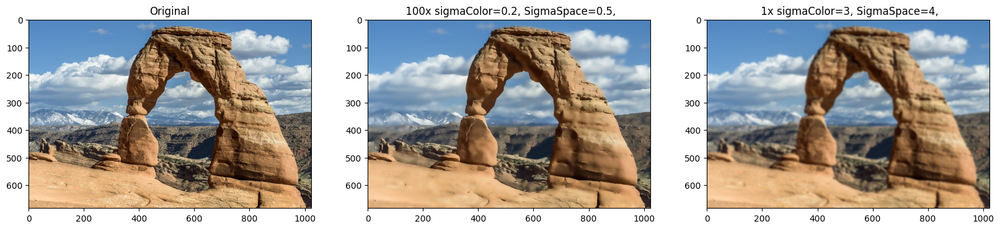

In [20]:
sigmaColor_small = 0.2
sigmaSpace_small = 0.5
sigmaColor_big = 3
sigmaSpace_big = 4
iter = 100
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.imshow(image_bilat), plt.title('Original')
plt.subplot(1,3,2), plt.imshow(apply_bilateral(image_bilat,sigmaColor_small,sigmaSpace_small,iter)), plt.title(f' {iter}x sigmaColor={sigmaColor_small}, SigmaSpace={sigmaSpace_small},')
plt.subplot(1,3,3), plt.imshow(apply_bilateral(image_bilat,sigmaColor_big,sigmaSpace_big,1)), plt.title(f' 1x sigmaColor={sigmaColor_big}, SigmaSpace={sigmaSpace_big},')
plt.show()

In this case by using smaller values for both the big and the iterative small one we can see a better image and some more interesting smoothing. In this case we can see that the small one applied iteratively is able to preserve better edges and smooths away the rest, this is due to a much more detailed locality computation, having a small locality we are able to preserve more the important edges of the image. While appliying a bigger one, edges still are preserved but worse 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


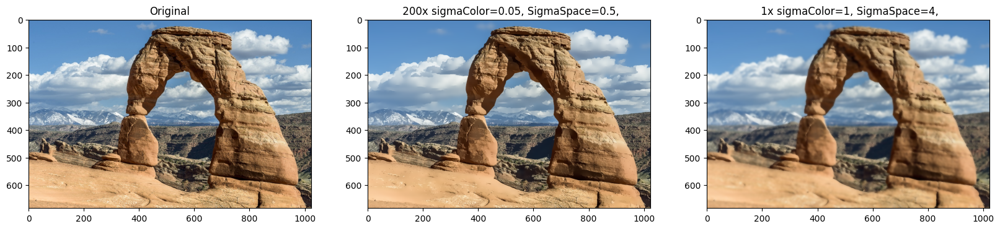

In [21]:
sigmaColor_small = 0.05
sigmaSpace_small = 0.5
sigmaColor_big = 1
sigmaSpace_big = 4
iter = 200
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.imshow(image_bilat), plt.title('Original')
plt.subplot(1,3,2), plt.imshow(apply_bilateral(image_bilat,sigmaColor_small,sigmaSpace_small,iter)), plt.title(f' {iter}x sigmaColor={sigmaColor_small}, SigmaSpace={sigmaSpace_small},')
plt.subplot(1,3,3), plt.imshow(apply_bilateral(image_bilat,sigmaColor_big,sigmaSpace_big,1)), plt.title(f' 1x sigmaColor={sigmaColor_big}, SigmaSpace={sigmaSpace_big},')
plt.show()

To some extent then it is possible to somehow retrieve something "similar" from 1 big bilateral filter application and an iterative small but in someway they will always different in the way one preserves edges and smooths stuff. The big one will base the smoothing and edge preserving in a much different way having a bigger locality hence smoothing more the edges and more uniformly the overall image, while the small one with multiple iteration is able to better preserve edges and smooth regions where there are no big intensity changes.

## Image Stylization [7 points]

Design and implement a filtering procedure that performs the image stylization visualized in Figure 3. More precisely, use the knowledge from the lectures on linear and non-linear filtering to develop a sequence of filtering steps that turn the image on the left in Figure 3 into the image on the right. You do not need to obtain the same, but somewhat similar results. However, we want you to focus on two aspects of the stylization you are asked to develop. First, it smoothes the image in a particular way. Second, it adds black lines along image discontinuities. These lines are approximately 2-3 pixels wide. In your report, explain the sequence of filtering steps and provide the intermediate results. For the implementation, you can use any Numpy or OpenCV built-in functions which help you implement the filtering procedure. With the assignment, we provide image __delicate\_arch_, which you should use for this exercise. 

<span style="color:red">Hint.</span> Consider using an iterative filtering procedure for better results.

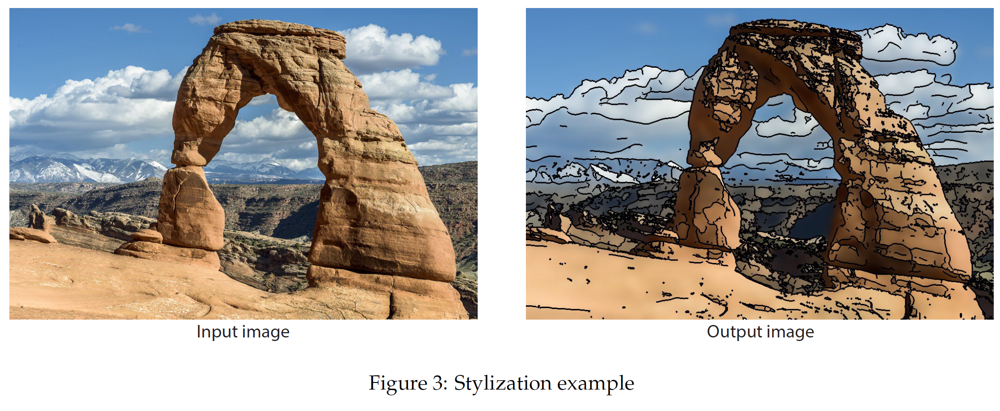

In [22]:
pil_image = Image.open("delicate_arch.jpg").convert("RGB")
image = np.array(pil_image).astype(np.float32) / 255.0 
gray = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
gray = gray.astype(np.float32) / 255.0

bilat = apply_bilateral(image, 0.05, 9, 100)

gray_smooth = cv2.cvtColor((bilat * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0

prewitt_x = np.array([[1, 0, -1],
                      [1, 0, -1],
                      [1, 0, -1]], dtype=np.float32)
prewitt_y = np.array([[1, 1, 1],
                      [0, 0, 0],
                      [-1, -1, -1]], dtype=np.float32)

grad_x = cv2.filter2D(gray_smooth, -1, prewitt_x)
grad_y = cv2.filter2D(gray_smooth, -1, prewitt_y)
grad_mag = np.sqrt(grad_x**2 + grad_y**2)

# NOTE: Threshold value matters for edges
edges = (grad_mag > 0.21).astype(np.uint8) * 255

kernel = np.ones((2,2), np.uint8)
edges_dilated = cv2.dilate(edges, kernel, iterations=1)

kernel = np.ones((3, 3), np.uint8)
edges_cleaned = cv2.erode(edges_dilated, kernel, iterations=1)

edges_mask = 1 - (edges_cleaned / 255.0)
edges_mask_color = np.repeat(edges_mask[:, :, np.newaxis], 3, axis=2)  # Make it 3-channel

stylized = bilat * edges_mask_color
stylized = (stylized * 255).astype(np.uint8)


###  <span style="color:orange"> _Report_ </span>
<span style="color:orange"> _Report your results below. Remember to explain the sequence of filtering steps and provide the intermediate results. Please inline the resulting images with your text explaining the approach (e.g. as figures) so that the report is cohesive._ </span>

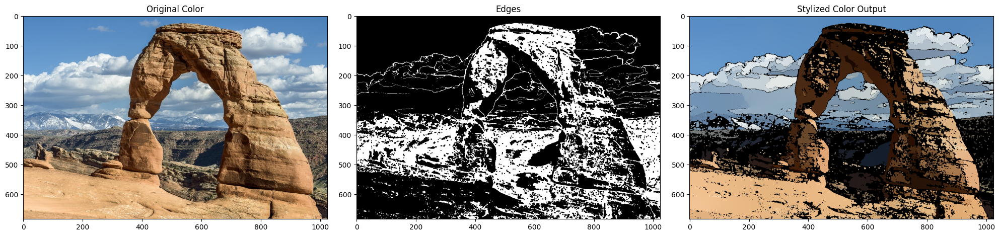

In [23]:
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1), plt.imshow(image), plt.title("Original Color")
plt.subplot(1, 3, 2), plt.imshow(edges_cleaned, cmap='gray'), plt.title("Edges")
plt.subplot(1, 3, 3), plt.imshow(stylized), plt.title("Stylized Color Output")
plt.tight_layout()
plt.show()

I have been trying for 1 hour to adjust the parameters to make it the same as yours it just doesn't work.....

I talked to the professor and he said that it's not a problem if it doesn not match and that this is fine. What matters is the process.

What I do is as suggested I apply an iterative bilateral filter with a quite small sigmaColor of value 0.05 which means that the range kernel does not affect the image too much as the domain kernel where I used a higher values to smooth more the image. This gives us the possibility of smoothing a lot the image while preserving very well the edges.

After this I decided to use a prewitt with a threshold value in order to keep the stronger edges and remove the weaker one so that I could massage the amount of black edges on the image. Based on the different output I also tried to adjust it.

After all of this I applied the following morphological operations: Dilation and erosion. Dilation gave me the ability of making edges bigger and wider and more "connected", furthermore I adjusted them through erosion which thins them down.
